In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his_88params/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_dreamz_12chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-5807.82036858]
 [-4521.54064555]
 [-4231.12861385]
 ..., 
 [  151.04792367]
 [  151.04792367]
 [  151.04792367]]
Logp of trace:  a  chain:  1  =  [ 152.54104058]
Logp of trace:  a  chain:  2  =  [ 149.43499536]
Logp of trace:  a  chain:  3  =  [ 152.04617586]
Logp of trace:  a  chain:  4  =  [ 151.98446553]
Logp of trace:  a  chain:  5  =  [ 148.50573098]
Logp of trace:  a  chain:  6  =  [ 153.33956731]
Logp of trace:  a  chain:  7  =  [ 151.84877577]
Logp of trace:  a  chain:  8  =  [ 152.3267607]
Logp of trace:  a  chain:  9  =  [ 147.47255541]
Logp of trace:  a  chain:  10  =  [ 154.82718627]
Logp of trace:  a  chain:  11  =  [ 153.0660372]
Logp of trace:  b  chain: 0 =  [[-2585.58331539]
 [-2585.58331539]
 [-2550.92604182]
 ..., 
 [  150.99966573]
 [  150.99966573]
 [  150.99966573]]
Logp of trace:  b  chain:  1  =  [ 147.34622159]
Logp of trace:  b  chain:  2  =  [ 149.55746996]
Logp of trace:  b  chain:  3  =  [ 150.06702383]
Logp of trace:  b  c

In [5]:
traces['a'][0][:,72]

array([-1.02026323, -1.16269573, -1.24973167, ...,  0.98838738,
        0.98838738,  0.98838738])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  19  of  88  parameters.
Percent of parameters with GR below 1.2:  21.5909090909
Number of parameters with GR below 1.1:  0  of  88  parameters.
Percent of parameters with GR below 1.1:  0.0


[19, 21.59090909090909, 0, 0.0]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  41  of  88  parameters.
Percent of parameters with GR below 1.2:  46.5909090909
Number of parameters with GR below 1.1:  7  of  88  parameters.
Percent of parameters with GR below 1.1:  7.95454545455


[41, 46.590909090909086, 7, 7.954545454545454]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  36  of  88  parameters.
Percent of parameters with GR below 1.2:  40.9090909091
Number of parameters with GR below 1.1:  5  of  88  parameters.
Percent of parameters with GR below 1.1:  5.68181818182


[36, 40.909090909090914, 5, 5.681818181818182]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  17  of  88  parameters.
Percent of parameters with GR below 1.2:  19.3181818182
Number of parameters with GR below 1.1:  2  of  88  parameters.
Percent of parameters with GR below 1.1:  2.27272727273


[17, 19.318181818181817, 2, 2.272727272727273]

50000
12
50000


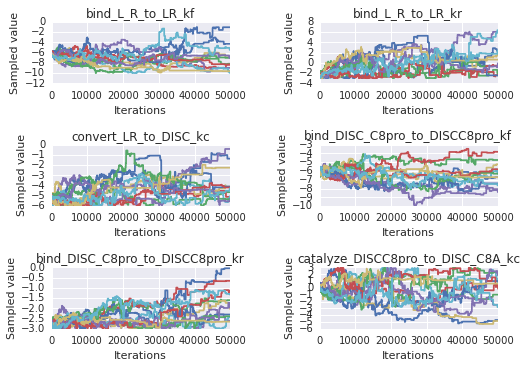

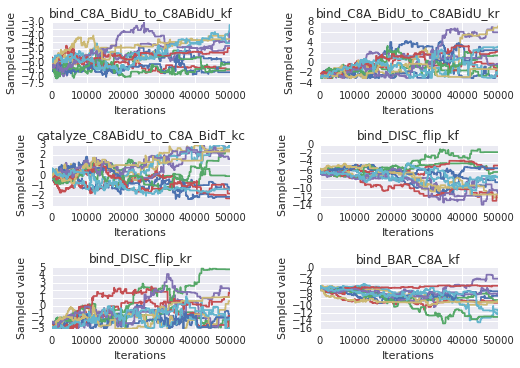

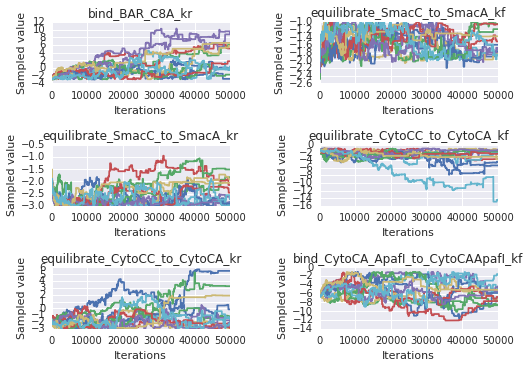

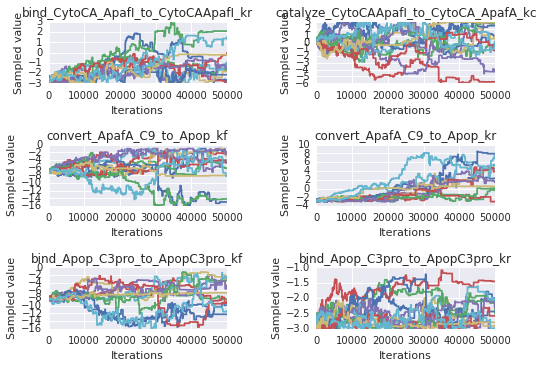

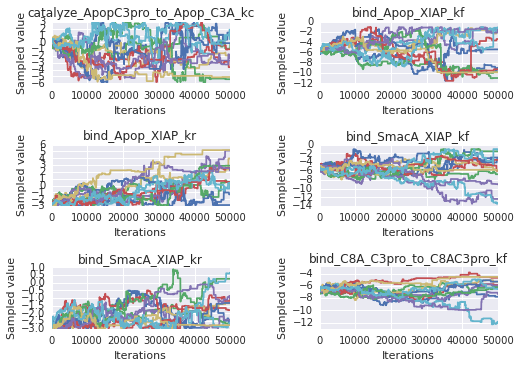

...

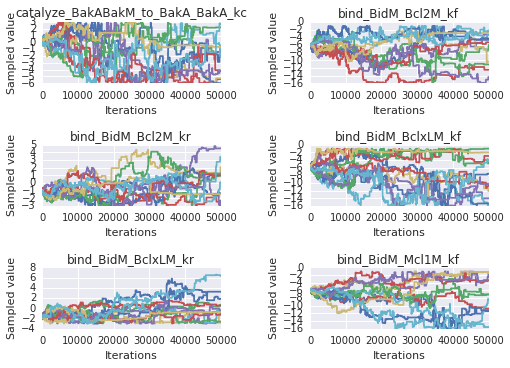

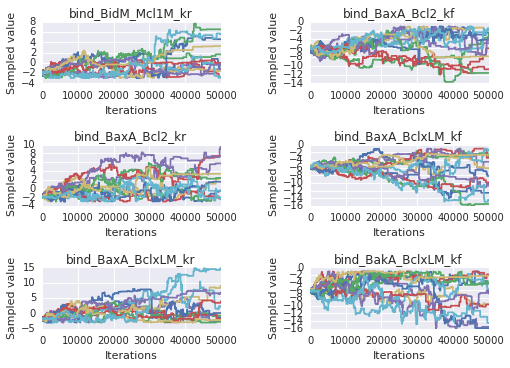

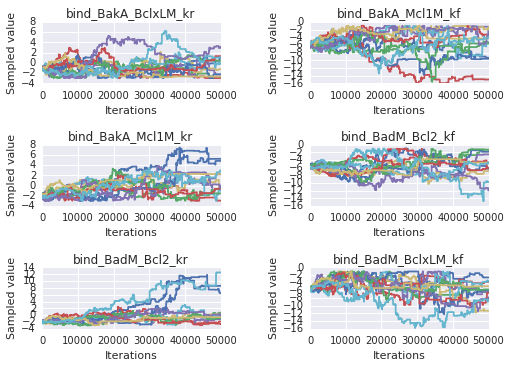

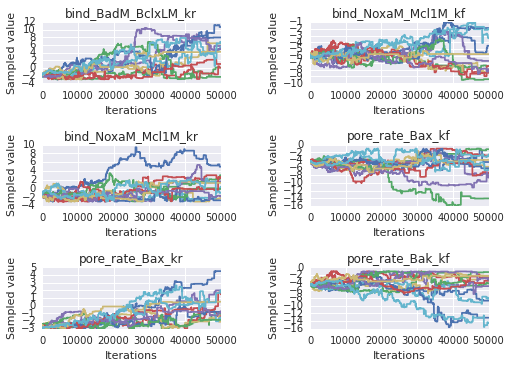

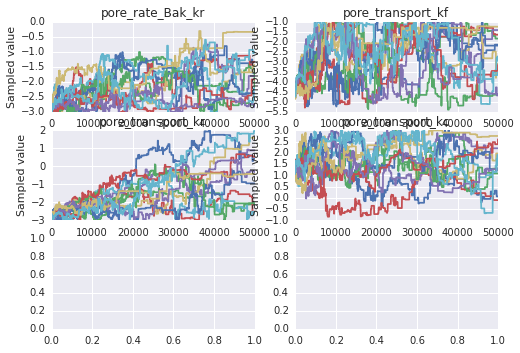

In [11]:
sample_plots(param_trace_dicts['a'])

In [12]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


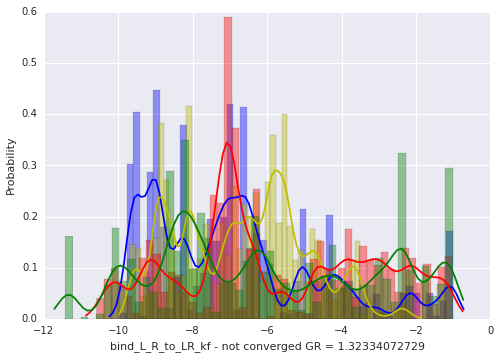

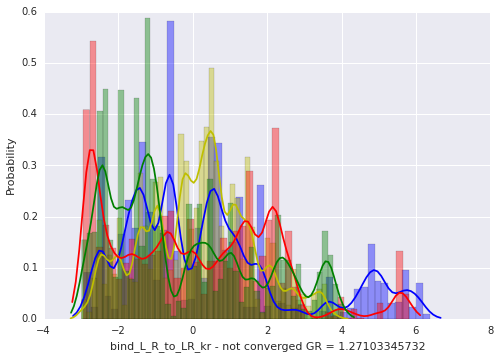

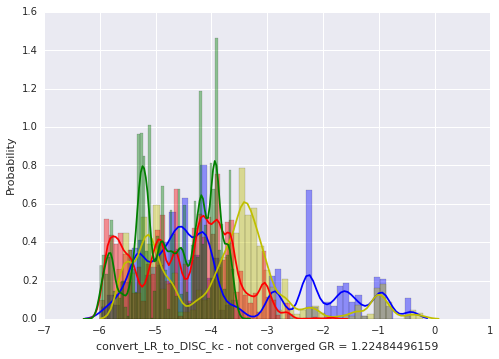

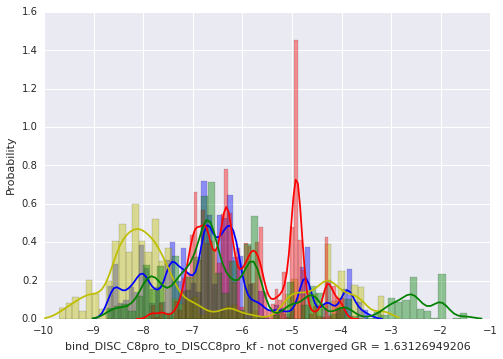

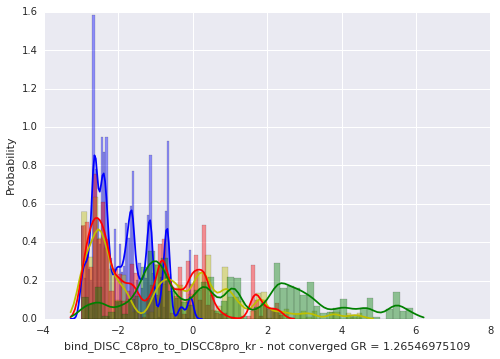

...

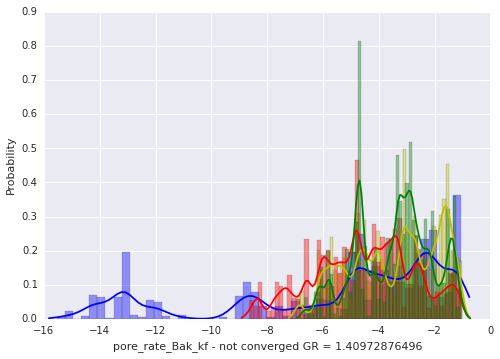

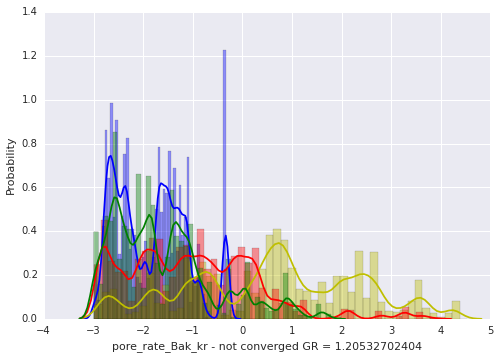

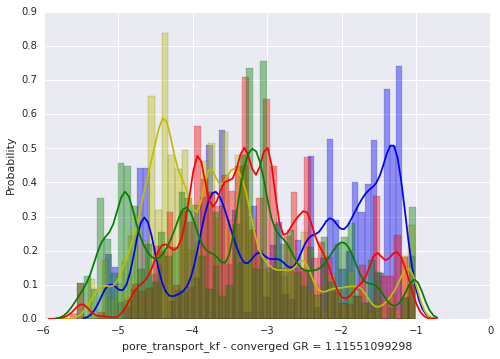

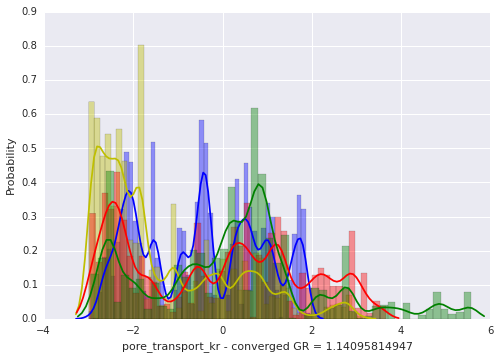

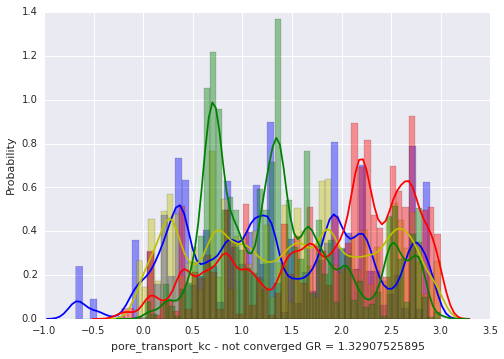

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.17699172, -6.17699172, -6.17699172, ..., -8.17955183,
       -8.17955183, -8.17955183])

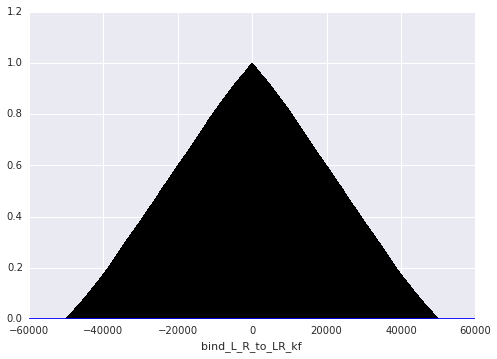

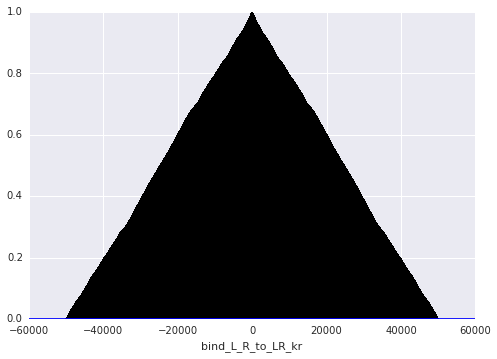

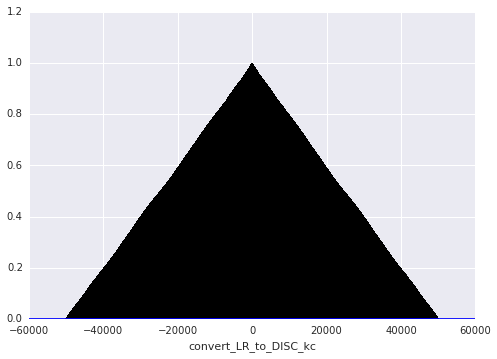

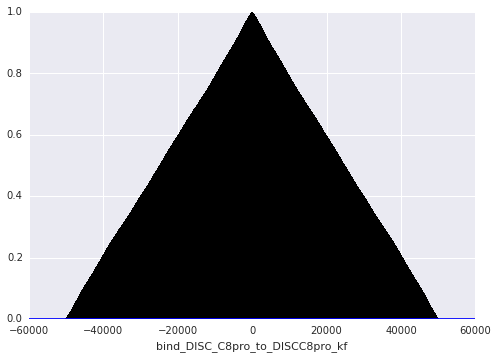

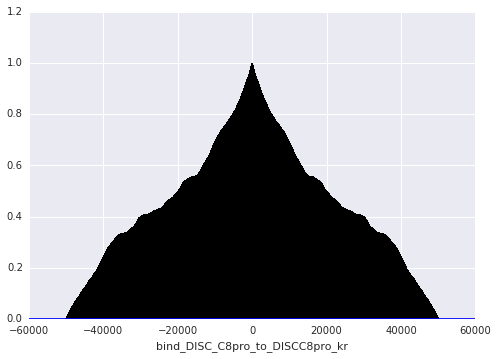

...

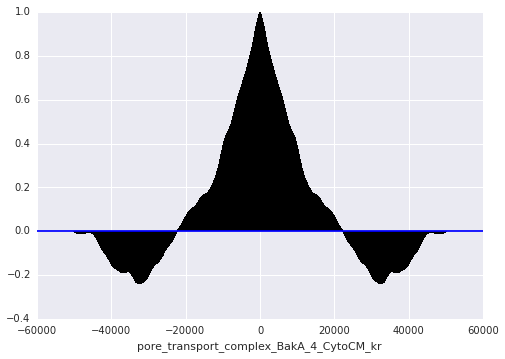

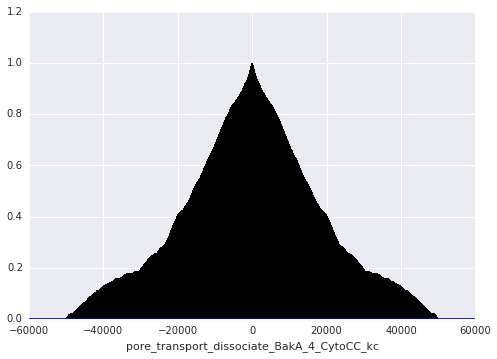

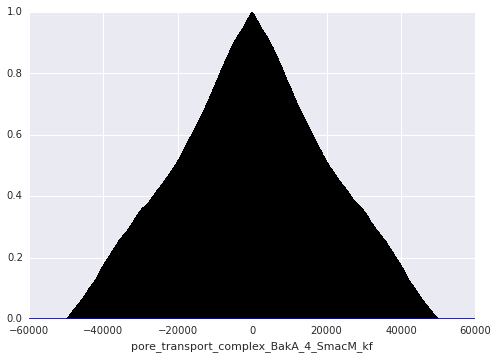

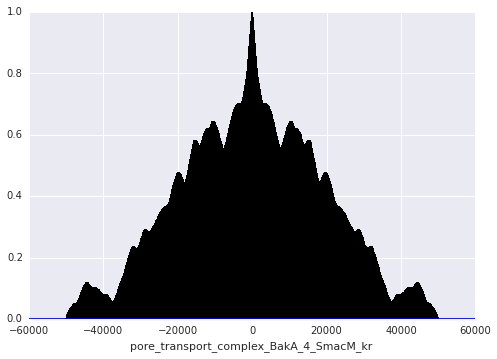

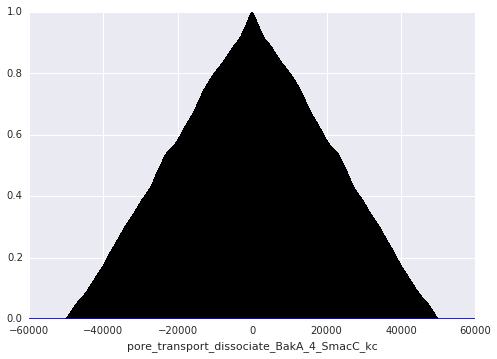

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

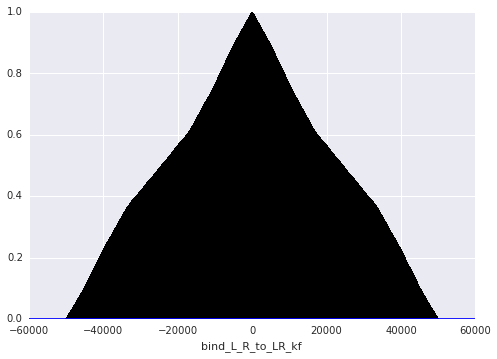

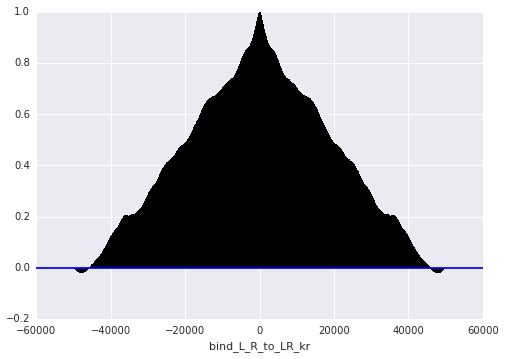

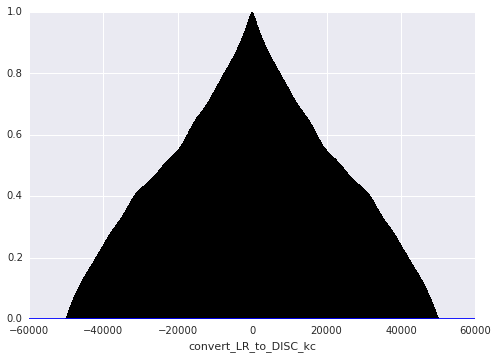

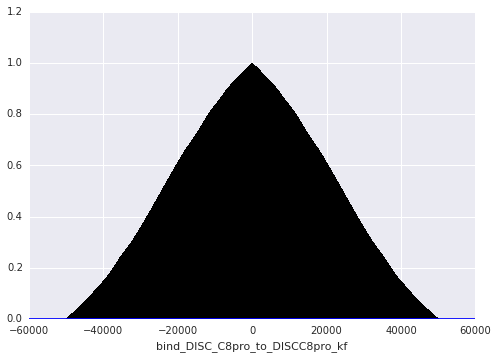

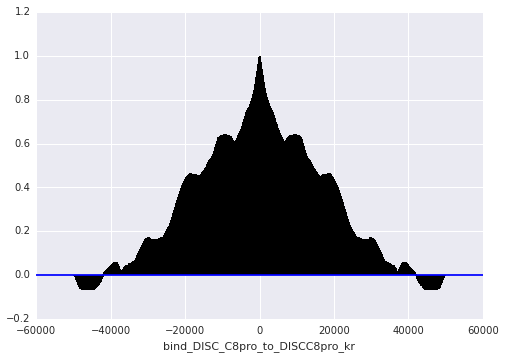

...

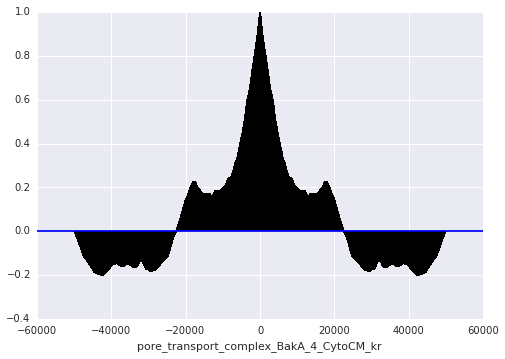

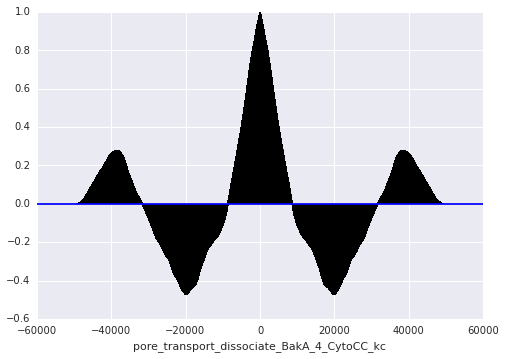

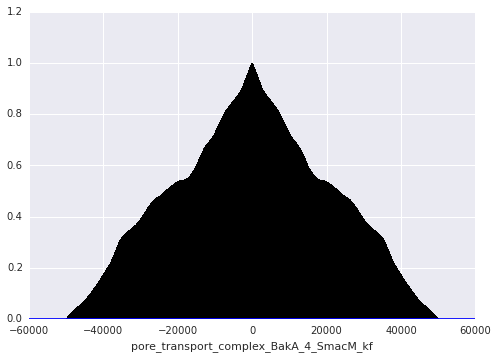

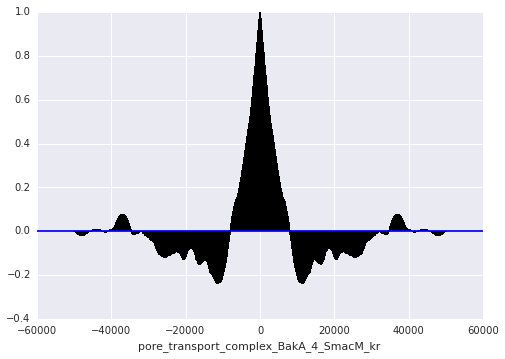

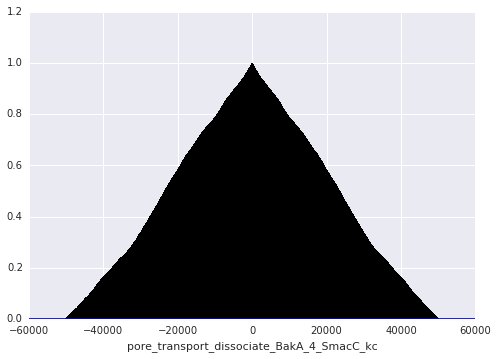

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

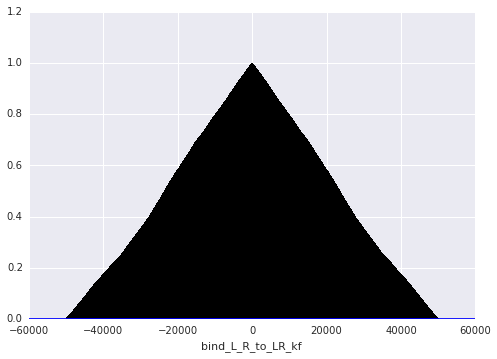

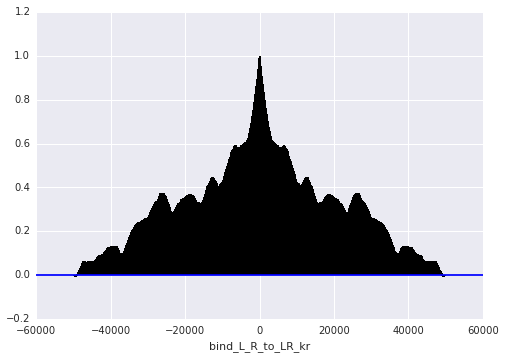

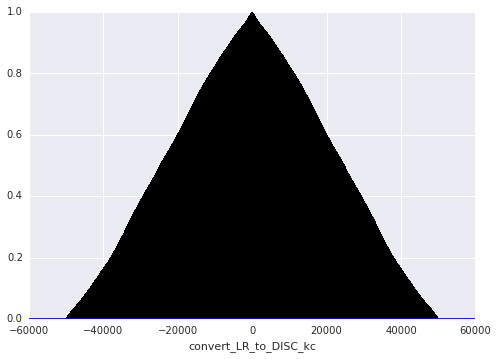

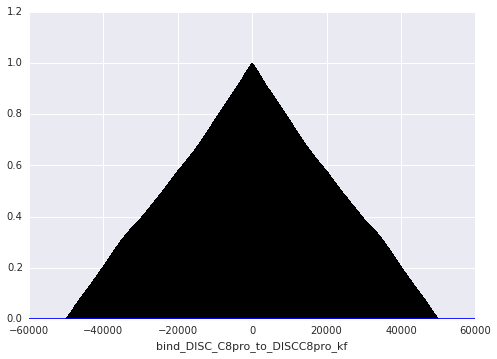

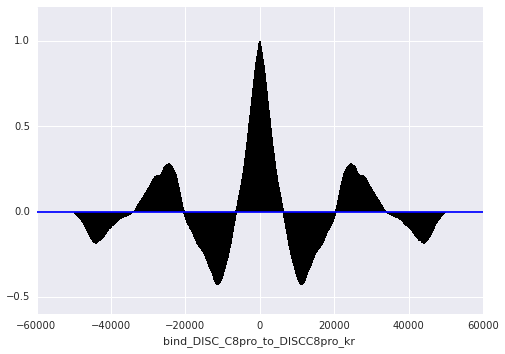

...

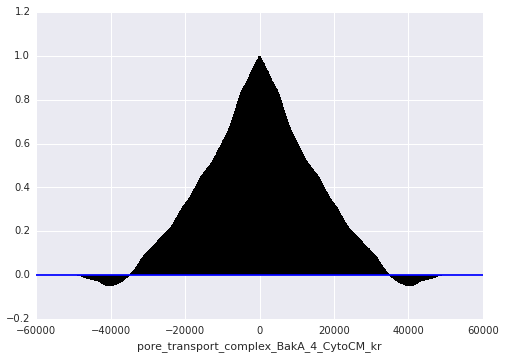

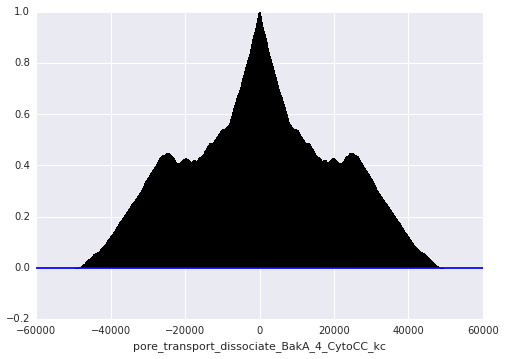

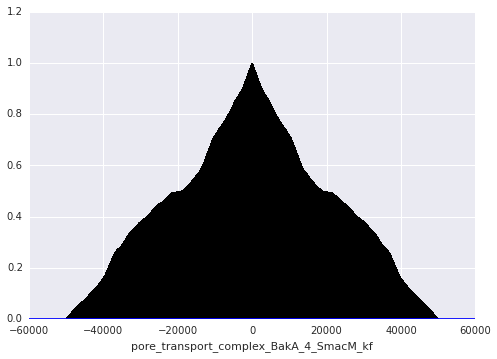

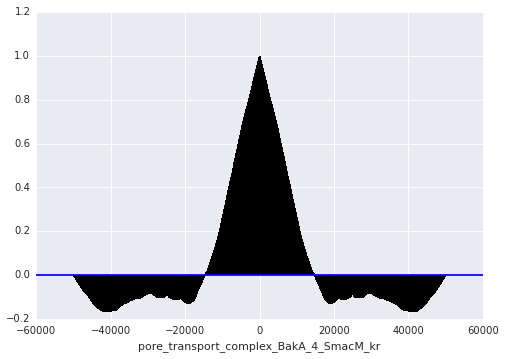

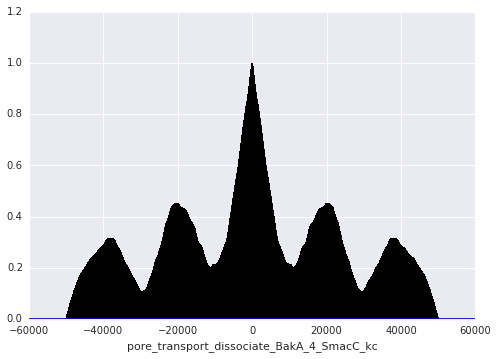

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [15]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  503  acceptance rate:  0.01006
N acceptances for parameter:  bind_L_R_to_LR_kr  =  528  acceptance rate:  0.01056
N acceptances for parameter:  convert_LR_to_DISC_kc  =  509  acceptance rate:  0.01018
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  491  acceptance rate:  0.00982
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  518  acceptance rate:  0.01036
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  498  acceptance rate:  0.00996
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  504  acceptance rate:  0.01008
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  528  acceptance rate:  0.01056
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  490  acceptance rate:  0.0098
N acceptances for parameter:  bind_DISC_flip_kf  =  520  acceptance rate:  0.0104
N acceptances for parameter:  bind_DISC_flip_kr  =  520  acceptance rate:  0.0104
N accept

array([ 0.01006,  0.01056,  0.01018,  0.00982,  0.01036,  0.00996,
        0.01008,  0.01056,  0.0098 ,  0.0104 ,  0.0104 ,  0.01012,
        0.01044,  0.01062,  0.0103 ,  0.01042,  0.01036,  0.01054,
        0.01048,  0.01044,  0.01036,  0.01042,  0.01068,  0.01042,
        0.01046,  0.01024,  0.01076,  0.01032,  0.01054,  0.00976,
        0.01012,  0.01028,  0.01008,  0.01064,  0.01006,  0.01036,
        0.01078,  0.01014,  0.00964,  0.01064,  0.01038,  0.00966,
        0.0103 ,  0.0103 ,  0.01006,  0.01052,  0.01046,  0.01036,
        0.00984,  0.0102 ,  0.01046,  0.01056,  0.01056,  0.01068,
        0.01036,  0.01032,  0.01044,  0.01036,  0.01082,  0.0111 ,
        0.01022,  0.01062,  0.0105 ,  0.00998,  0.01062,  0.01086,
        0.0101 ,  0.01046,  0.0103 ,  0.01028,  0.01016,  0.01028,
        0.01028,  0.01058,  0.01024,  0.0103 ,  0.0106 ,  0.01064,
        0.01036,  0.01082,  0.01064,  0.01078,  0.01006,  0.01036,
        0.01002,  0.0105 ,  0.01048,  0.01038])

In [16]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  460  acceptance rate:  0.0092
N acceptances for parameter:  bind_L_R_to_LR_kr  =  481  acceptance rate:  0.00962
N acceptances for parameter:  convert_LR_to_DISC_kc  =  455  acceptance rate:  0.0091
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  448  acceptance rate:  0.00896
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  486  acceptance rate:  0.00972
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  466  acceptance rate:  0.00932
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  457  acceptance rate:  0.00914
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  474  acceptance rate:  0.00948
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  474  acceptance rate:  0.00948
N acceptances for parameter:  bind_DISC_flip_kf  =  474  acceptance rate:  0.00948
N acceptances for parameter:  bind_DISC_flip_kr  =  466  acceptance rate:  0.00932
N accep

array([ 0.0092 ,  0.00962,  0.0091 ,  0.00896,  0.00972,  0.00932,
        0.00914,  0.00948,  0.00948,  0.00948,  0.00932,  0.00912,
        0.00954,  0.00964,  0.0088 ,  0.00924,  0.00932,  0.00942,
        0.00988,  0.00948,  0.00932,  0.00894,  0.00948,  0.0096 ,
        0.00922,  0.00944,  0.00952,  0.00942,  0.00934,  0.00922,
        0.00932,  0.00862,  0.00888,  0.00944,  0.00928,  0.00924,
        0.00946,  0.00894,  0.00902,  0.00922,  0.00972,  0.00862,
        0.00926,  0.00936,  0.00902,  0.00914,  0.00952,  0.00964,
        0.00944,  0.00952,  0.0093 ,  0.00942,  0.00962,  0.0094 ,
        0.00918,  0.00952,  0.00984,  0.00952,  0.00918,  0.0095 ,
        0.00932,  0.0097 ,  0.00984,  0.00864,  0.00982,  0.00944,
        0.00918,  0.00974,  0.00932,  0.00958,  0.00918,  0.00938,
        0.00938,  0.00964,  0.0093 ,  0.00936,  0.00976,  0.00918,
        0.00906,  0.00974,  0.00924,  0.00928,  0.0098 ,  0.0094 ,
        0.00966,  0.00946,  0.00928,  0.00948])

In [17]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  422  acceptance rate:  0.00844
N acceptances for parameter:  bind_L_R_to_LR_kr  =  421  acceptance rate:  0.00842
N acceptances for parameter:  convert_LR_to_DISC_kc  =  411  acceptance rate:  0.00822
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  412  acceptance rate:  0.00824
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  413  acceptance rate:  0.00826
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  421  acceptance rate:  0.00842
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  412  acceptance rate:  0.00824
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  436  acceptance rate:  0.00872
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  408  acceptance rate:  0.00816
N acceptances for parameter:  bind_DISC_flip_kf  =  401  acceptance rate:  0.00802
N acceptances for parameter:  bind_DISC_flip_kr  =  429  acceptance rate:  0.00858
N acc

array([ 0.00844,  0.00842,  0.00822,  0.00824,  0.00826,  0.00842,
        0.00824,  0.00872,  0.00816,  0.00802,  0.00858,  0.00802,
        0.00868,  0.00838,  0.00842,  0.0086 ,  0.0086 ,  0.00824,
        0.00816,  0.00832,  0.00872,  0.00842,  0.00866,  0.00872,
        0.00876,  0.00842,  0.00854,  0.00844,  0.00866,  0.00818,
        0.00838,  0.00838,  0.0078 ,  0.00892,  0.00852,  0.00816,
        0.00838,  0.00798,  0.00798,  0.00864,  0.00892,  0.00822,
        0.00844,  0.00874,  0.00834,  0.00842,  0.00854,  0.00868,
        0.00832,  0.0085 ,  0.0084 ,  0.0086 ,  0.00824,  0.0083 ,
        0.00858,  0.0083 ,  0.0083 ,  0.00852,  0.0083 ,  0.00868,
        0.00864,  0.00856,  0.00808,  0.00782,  0.00844,  0.00844,
        0.00862,  0.00846,  0.00858,  0.00818,  0.00832,  0.00826,
        0.0085 ,  0.00848,  0.00864,  0.0086 ,  0.00846,  0.00862,
        0.0087 ,  0.00862,  0.0085 ,  0.0082 ,  0.00856,  0.00856,
        0.00854,  0.0087 ,  0.00854,  0.00824])

In [18]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  422  acceptance rate:  0.00844
N acceptances for parameter:  bind_L_R_to_LR_kr  =  421  acceptance rate:  0.00842
N acceptances for parameter:  convert_LR_to_DISC_kc  =  411  acceptance rate:  0.00822
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  412  acceptance rate:  0.00824
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  413  acceptance rate:  0.00826
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  421  acceptance rate:  0.00842
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  412  acceptance rate:  0.00824
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  436  acceptance rate:  0.00872
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  408  acceptance rate:  0.00816
N acceptances for parameter:  bind_DISC_flip_kf  =  401  acceptance rate:  0.00802
N acceptances for parameter:  bind_DISC_flip_kr  =  429  acceptance rate:  0.00858
N acc

array([ 0.00844,  0.00842,  0.00822,  0.00824,  0.00826,  0.00842,
        0.00824,  0.00872,  0.00816,  0.00802,  0.00858,  0.00802,
        0.00868,  0.00838,  0.00842,  0.0086 ,  0.0086 ,  0.00824,
        0.00816,  0.00832,  0.00872,  0.00842,  0.00866,  0.00872,
        0.00876,  0.00842,  0.00854,  0.00844,  0.00866,  0.00818,
        0.00838,  0.00838,  0.0078 ,  0.00892,  0.00852,  0.00816,
        0.00838,  0.00798,  0.00798,  0.00864,  0.00892,  0.00822,
        0.00844,  0.00874,  0.00834,  0.00842,  0.00854,  0.00868,
        0.00832,  0.0085 ,  0.0084 ,  0.0086 ,  0.00824,  0.0083 ,
        0.00858,  0.0083 ,  0.0083 ,  0.00852,  0.0083 ,  0.00868,
        0.00864,  0.00856,  0.00808,  0.00782,  0.00844,  0.00844,
        0.00862,  0.00846,  0.00858,  0.00818,  0.00832,  0.00826,
        0.0085 ,  0.00848,  0.00864,  0.0086 ,  0.00846,  0.00862,
        0.0087 ,  0.00862,  0.0085 ,  0.0082 ,  0.00856,  0.00856,
        0.00854,  0.0087 ,  0.00854,  0.00824])